In [98]:
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import train_test_split

from sklearn.metrics import roc_curve, auc,classification_report,accuracy_score
from sklearn.metrics import mean_squared_error ,mean_absolute_error,log_loss
from sklearn.metrics import confusion_matrix

import warnings
warnings.filterwarnings('ignore')

In [99]:
#converting into dataframe
df = pd.read_csv('abalone.csv')

In [100]:
df.shape

(4177, 9)

In [101]:
df.head()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [102]:
df.describe()

,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
count,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000
mean,0.523992,0.407881,0.139516,0.828742,0.359367,0.180594,0.238831,9.933684
std,0.120093,0.099240,0.041827,0.490389,0.221963,0.109614,0.139203,3.224169
min,0.075000,0.055000,0.000000,0.002000,0.001000,0.000500,0.001500,1.000000
25%,0.450000,0.350000,0.115000,0.441500,0.186000,0.093500,0.130000,8.000000
50%,0.545000,0.425000,0.140000,0.799500,0.336000,0.171000,0.234000,9.000000
75%,0.615000,0.480000,0.165000,1.153000,0.502000,0.253000,0.329000,11.000000
max,0.815000,0.650000,1.130000,2.825500,1.488000,0.760000,1.005000,29.000000


### Imputing Missing Values with Medians

In [103]:
df.isnull().sum()

Sex               0
Length            0
Diameter          0
Height            0
Whole weight      0
Shucked weight    0
Viscera weight    0
Shell weight      0
Rings             0
dtype: int64

In [104]:
df['Rings'].value_counts()

9     689
10    634
8     568
11    487
7     391
12    267
6     259
13    203
14    126
5     115
15    103
16     67
17     58
4      57
18     42
19     32
20     26
3      15
21     14
23      9
22      6
24      2
27      2
1       1
25      1
2       1
26      1
29      1
Name: Rings, dtype: int64

# 3. Exploratory Data Analysis Data Visualization

## A.Univariate analysis

### How many male,female and innfant abalones are there?

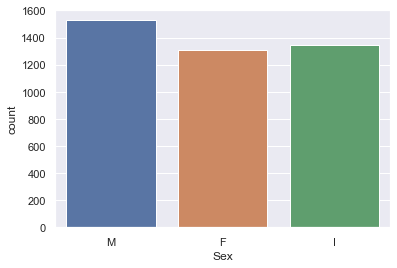

In [105]:
sns.set(style="darkgrid")
ax = sns.countplot(x="Sex", data=df)

In [106]:
df['Sex'].value_counts()

M    1528
I    1342
F    1307
Name: Sex, dtype: int64

Summary:<br>
1.There are more male abalones <br>
2.Almost equal number of Female and Infant abalones 

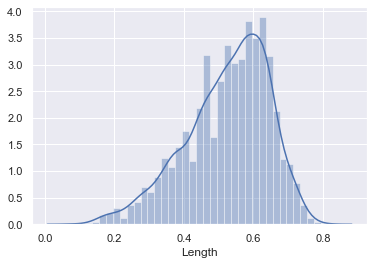

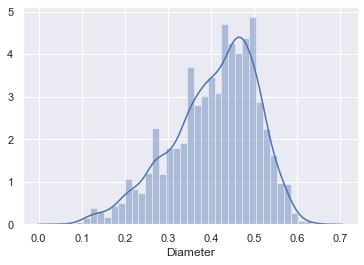

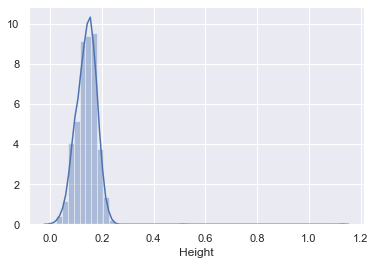

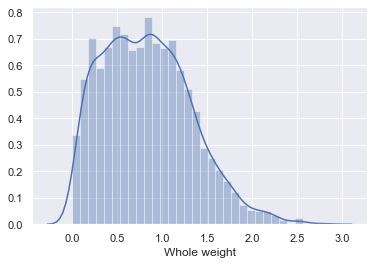

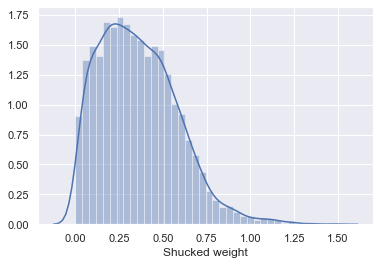

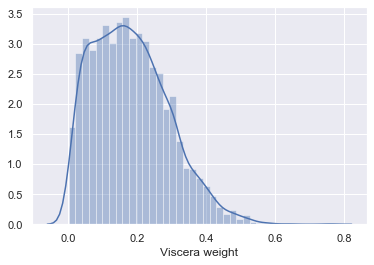

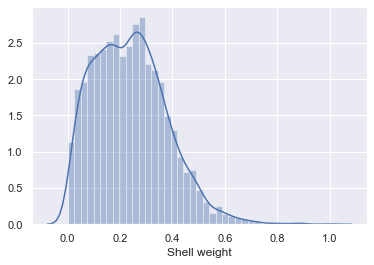

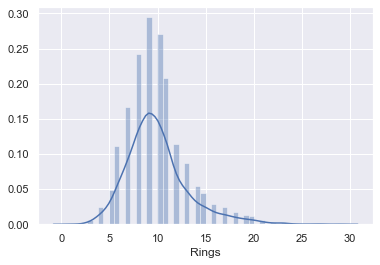

In [107]:
components=df.drop(['Sex'],axis=1).columns
for comp in components:
    sns.distplot(df[comp])
    plt.show()

## Applying transform to remove skewness

In [108]:
Length_transformed = df['Length']**(1/2)
Length_transformed.describe()

count    4177.000000
mean        0.718405
std         0.088813
min         0.273861
25%         0.670820
50%         0.738241
75%         0.784219
max         0.902774
Name: Length, dtype: float64

In [109]:
df['Length']=Length_transformed

In [110]:
Diameter_transformed = df['Diameter']**(1/2)
Diameter_transformed.describe()

count    4177.000000
mean        0.633180
std         0.083466
min         0.234521
25%         0.591608
50%         0.651920
75%         0.692820
max         0.806226
Name: Diameter, dtype: float64

In [111]:
df['Diameter']=Diameter_transformed

## B. Bivariate analysis

### What is sexwise distribution of rings?

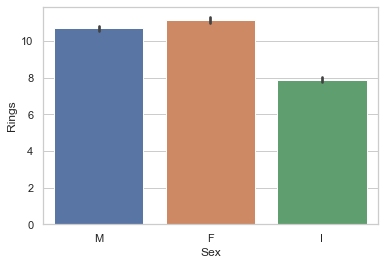

In [19]:
sns.set(style="whitegrid")
ax = sns.barplot(x="Sex", y="Rings", data=df)

Summary:<br>
1.Female abalone tend to have more number of rings 

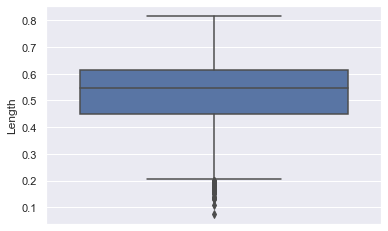

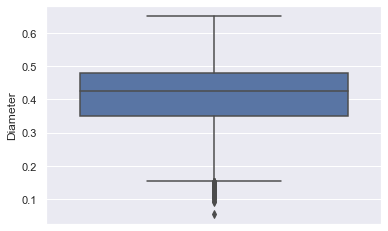

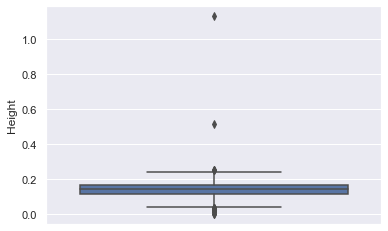

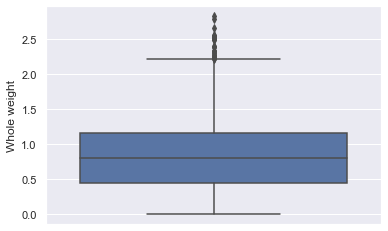

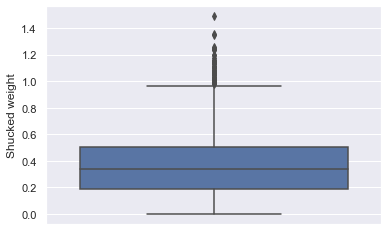

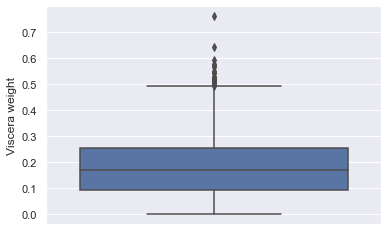

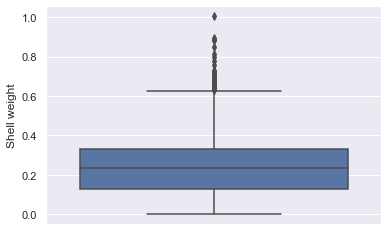

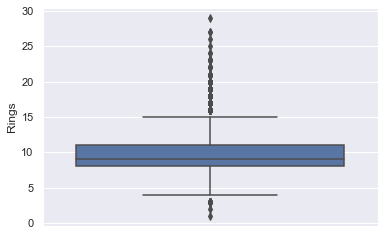

In [31]:
components=df.drop(['Sex'],axis=1).columns
for comp in components:
        sns.boxplot(y=comp,data=df)
        plt.show()

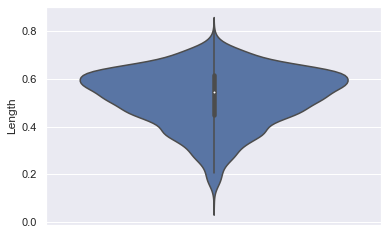

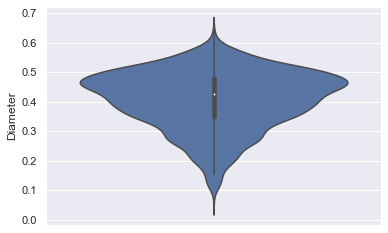

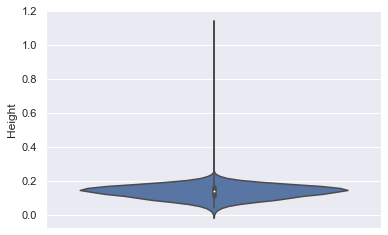

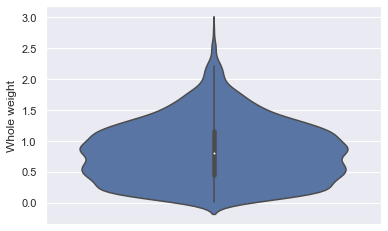

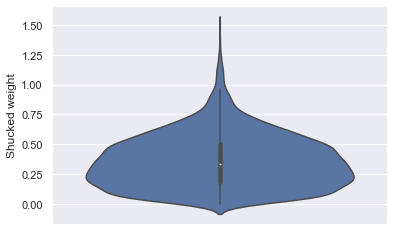

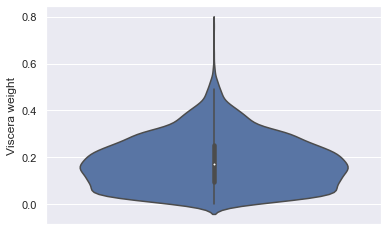

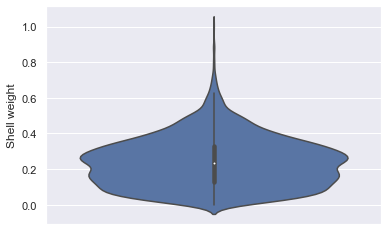

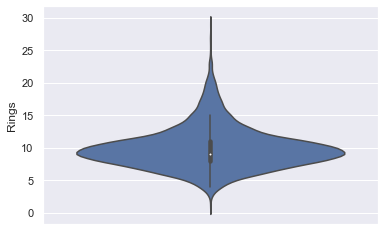

In [32]:
components=df.drop(['Sex'],axis=1).columns
for comp in components:
        sns.violinplot(y=comp,data=df)
        plt.show()

Summary: <br>
1.Except height all features all almost normal 

## C.Multivariate Analysis

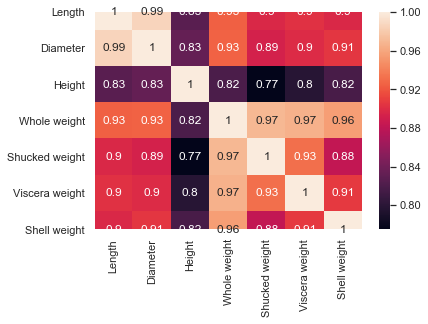

In [34]:
# as its a regression problem so drawing co-relation matrix is better than drawing pair plot
corr=df.drop(['Rings'],axis=1).corr()
sns.heatmap(corr, annot=True)

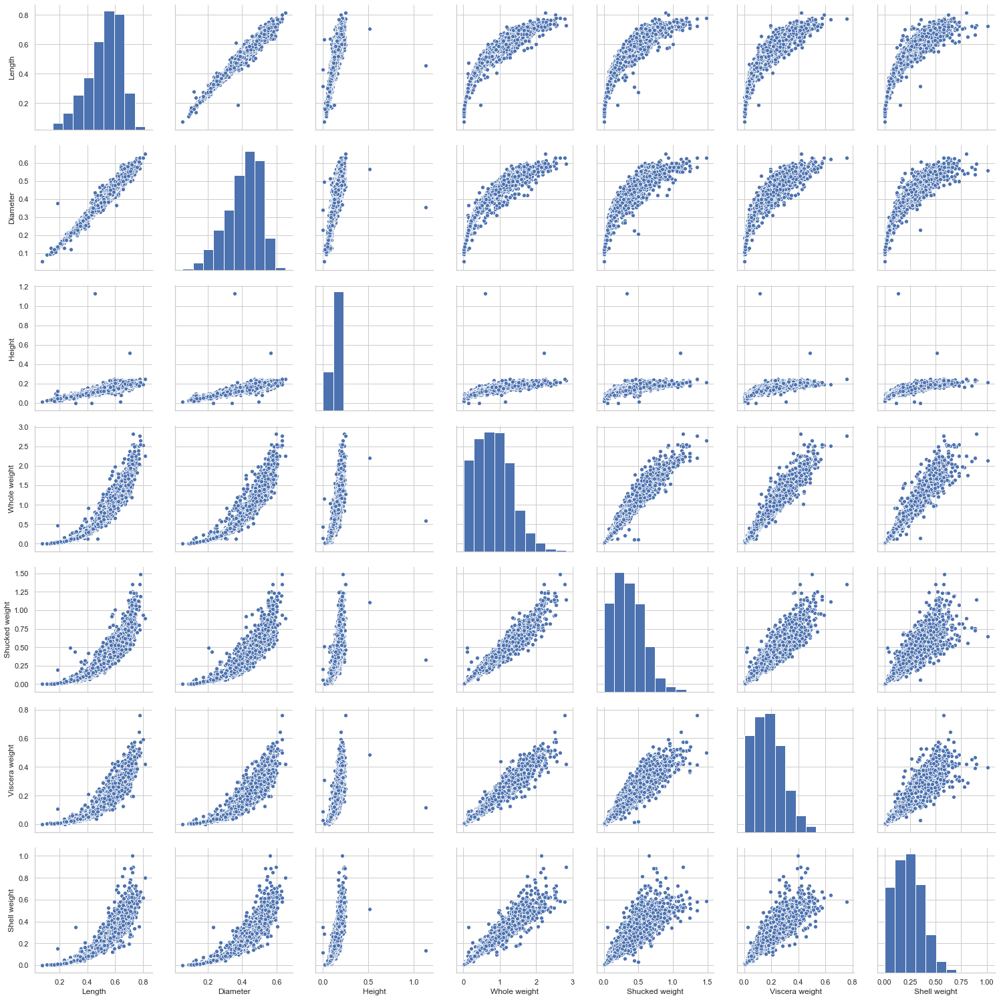

In [36]:
components=df.drop(['Rings','Sex'],axis=1).columns

sns.set_style("whitegrid");               #Step1:Set the gird to white.
sns.pairplot(df, vars=components ,height=3); #.pairplot(dataset,hue='',size=n) function to plot pairplot
plt.show()

Summary:<br>
1.All the features are highly co-rellated. <br>


# 4. Data pre-processing and cleaning

## A.Converting all features to numerical features 

In [112]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(df['Sex'])
df['Sex']=le.transform(df['Sex'])

In [113]:
df.head()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,2,0.674537,0.604152,0.095,0.5140,0.2245,0.1010,0.150,15
1,2,0.591608,0.514782,0.090,0.2255,0.0995,0.0485,0.070,7
2,0,0.728011,0.648074,0.135,0.6770,0.2565,0.1415,0.210,9
3,2,0.663325,0.604152,0.125,0.5160,0.2155,0.1140,0.155,10
4,1,0.574456,0.504975,0.080,0.2050,0.0895,0.0395,0.055,7


## B.Removing Outliers

In [114]:
from scipy import stats
z=abs(stats.zscore(df))
print(np.where(z>3))
df=df[(z<3).all(axis=1)]

(array([   6,   72,   81,   83,  129,  148,  148,  149,  149,  163,  164,
        165,  165,  165,  166,  166,  167,  168,  170,  181,  232,  236,
        236,  236,  237,  237,  238,  238,  239,  239,  270,  275,  277,
        278,  294,  305,  305,  306,  306,  310,  313,  314,  321,  321,
        334,  351,  355,  358,  358,  362,  375,  416,  417,  428,  431,
        433,  465,  465,  469,  478,  480,  501,  523,  523,  525,  525,
        526,  526,  530,  572,  611,  611,  628,  673,  674,  675,  678,
        694,  694,  696,  696,  718,  718,  719,  719,  720,  720,  744,
        754,  756,  811,  891,  891,  891,  892,  898, 1048, 1051, 1051,
       1052, 1053, 1053, 1054, 1055, 1055, 1056, 1193, 1197, 1199, 1202,
       1204, 1206, 1206, 1207, 1207, 1207, 1207, 1209, 1209, 1210, 1257,
       1417, 1417, 1418, 1422, 1426, 1427, 1427, 1427, 1428, 1429, 1429,
       1528, 1754, 1756, 1757, 1759, 1761, 1762, 1762, 1762, 1763, 1763,
       1763, 1821, 1824, 1824, 1982, 1986, 1986, 1

## B. Normalize all features

In [115]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(df)
df_tran=normalizer.transform(df)

In [116]:
df = pd.DataFrame(df_tran,columns=df.columns)

In [117]:
df.head()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,0.131826,0.044461,0.039821,0.006262,0.033879,0.014797,0.006657,0.009887,0.988692
1,0.272947,0.080739,0.070254,0.012283,0.030775,0.013579,0.006619,0.009553,0.955316
2,0.000000,0.080124,0.071326,0.014858,0.074510,0.028230,0.015573,0.023112,0.990528
3,0.195022,0.064681,0.058911,0.012189,0.050316,0.021014,0.011116,0.015114,0.975109
4,0.140517,0.080721,0.070957,0.011241,0.028806,0.012576,0.005550,0.007728,0.983616


## C. Mean Standardization

In [240]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()


scaler.fit(df['Length'].values.reshape(-1,1))
scal_Length=scaler.transform(df['Length'].values.reshape(-1,1))

scaler.fit(df['Diameter'].values.reshape(1,-1))
scal_Diameter=scaler.transform(df['Diameter'].values.reshape(1,-1))

scaler.fit(df['Height'].values.reshape(1,-1))
scal_Height=scaler.transform(df['Height'].values.reshape(1,-1))


scaler.fit(df['Whole weight'].values.reshape(1,-1))
scal_Whole_weight=scaler.transform(df['Whole weight'].values.reshape(1,-1))

scaler.fit(df['Shucked weight'].values.reshape(1,-1))
scal_Shucked_weight=scaler.transform(df['Shucked weight'].values.reshape(1,-1))


scaler.fit(df['Viscera weight'].values.reshape(1,-1))
scal_Viscera_weight=scaler.transform(df['Viscera weight'].values.reshape(1,-1))

scaler.fit(df['Shell weight'].values.reshape(1,-1))
scal_Shell_weight=scaler.transform(df['Shell weight'].values.reshape(1,-1))





In [242]:

df['Length']=scal_Length
df['Diameter']=scal_Diameter.transpose()
df['Height']=scal_Height.transpose()
df['Whole weight']=scal_Whole_weight.transpose()
df['Shucked weight']=scal_Shucked_weight.transpose()
df['Viscera weight']=scal_Viscera_weight.transpose()
df['Rings']=scal_Rings.transpose()
df['Shell weight']=scal_Shell_weight.transpose()

## D. Train_Test split

In [118]:
y=df['Rings']
x=df.drop(['Rings'],axis=1)

In [119]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [120]:
round(y_train, 2)

3133    0.99
498     0.99
1234    0.98
1501    0.98
435     0.99
        ... 
1130    0.97
1294    0.99
860     0.98
3507    0.99
3174    1.00
Name: Rings, Length: 2674, dtype: float64

# 5. Building Models

# Model1 : KNN

In [121]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor()

parameters = {'n_neighbors': range(1,100,10)}

clf = GridSearchCV(neigh, parameters, cv= 5)

clf.fit(X_train, y_train)



GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'n_neighbors': range(1, 100, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [122]:
clf.best_params_

{'n_neighbors': 1}

In [123]:
#KNN classifier sklearn : https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score

neigh = KNeighborsRegressor(n_neighbors=1)
neigh.fit(X_train, y_train)

y_test_pred = neigh.predict(X_test)
print(r2_score(y_test,y_test_pred))


0.9979668147250622


# Model 2 : Logistic Regression 

In [95]:
#Its a regression problem so can't apply

# Model 3 : Linear regression 

In [124]:
from sklearn.linear_model import LinearRegression
Lr = LinearRegression()
Lr.fit(X_train, y_train)

y_test_pred = Lr.predict(X_test)

print(r2_score(y_test,y_test_pred))

0.8769312778216598


# Model 4 : SVM

In [127]:
from sklearn.svm import SVR

parameters = [{'C': [0.001,0.01, 0.1, 1, 10, 100],  
              'gamma': [0.1,1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf']}]   #'poly','sigmoid' takes too much time

model = GridSearchCV(SVR(),parameters, cv=5)
model.fit(X_train, y_train)    

print(model.best_estimator_)
print(model.score(X_train, y_train))

SVR(C=0.001, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.1,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
-29.809773664074235


In [128]:
model.best_params_

{'C': 0.001, 'gamma': 0.1, 'kernel': 'rbf'}

In [129]:
from sklearn.model_selection import cross_val_score

C= [10**-4, 10**-2, 10**0, 10**2, 10**4]
k_scores = []

for k in C:
    #
    svm = SVR(C=k,gamma= 0.0001,kernel='rbf')
    
    scores = cross_val_score(svm,X_train, y_train, cv=10)
    
    k_scores.append(scores.mean())
print(k_scores)

[-29.37532057290345, -29.37532057290345, -29.37532057290345, -29.37532057290345, -29.37532057290345]


In [130]:
import math as mt
log_C=[]
for i in C:
     log_C.append(mt.log10(i))

Text(0, 0.5, 'Cross-Validated Accuracy')

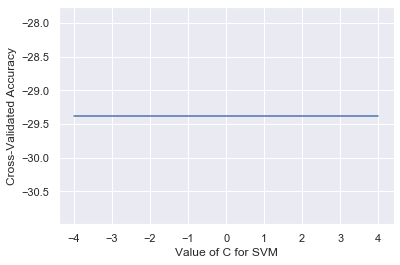

In [131]:
# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(log_C, k_scores)
plt.xlabel('Value of C for SVM')
plt.ylabel('Cross-Validated Accuracy')

In [134]:
from sklearn.svm import SVR

clf = SVR(C=0.001,gamma=0.10,kernel= 'rbf')

clf.fit(X_train, y_train)

y_test_pred = clf.predict(X_test)

print(r2_score(y_test,y_test_pred))

-27.429393763881542


# Model 5 : Decision Tree

In [135]:
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor


parameters = {'max_depth': [5, 10, 50, 100]}

clf = DecisionTreeRegressor(criterion='mse')

model = GridSearchCV(clf,parameters,cv=3)

model.fit(X_train, y_train)    

print(model.best_estimator_)
print(model.score(X_train, y_train))


DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')
0.9990982486689548


In [136]:
model.best_params_

{'max_depth': 10}

In [137]:
from sklearn.model_selection import cross_val_score

max_depth= [1,5,15,25,50]
k_scores = []

for k in max_depth:
    #
    DT = DecisionTreeRegressor(max_depth=k,criterion='mse', min_samples_split=100)
    
    scores = cross_val_score(DT,X_train, y_train, cv=10)
    
    k_scores.append(scores.mean())
print(k_scores)

[0.6065808945292965, 0.9142269180205856, 0.9323060321612944, 0.9323060321612946, 0.9323060321612943]


Text(0, 0.5, 'Cross-Validated Accuracy')

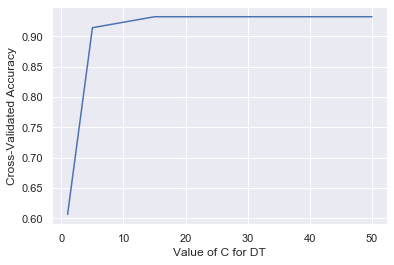

In [138]:
# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(max_depth, k_scores)
plt.xlabel('Value of C for DT')
plt.ylabel('Cross-Validated Accuracy')

# Traning with best hyperparameters

In [139]:
clf = DecisionTreeRegressor(criterion='mse',max_depth=10,min_samples_split=2)

clf.fit(X_train, y_train)


y_test_pred = clf.predict(X_test)

print(r2_score(y_test,y_test_pred))

0.9581215006972068


In [140]:
#https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
import pydotplus
from sklearn.tree import export_graphviz
from IPython.display import Image
from sklearn.externals.six import StringIO

dot_data = StringIO()

export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=X_train.columns,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

Image(graph.create_png())

# Model 6 : Ensemble Techniques 

## A. Bagging

In [141]:
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor


parameters = {'max_depth': [5, 10, 50, 100],'n_estimators':[10, 20 , 50, 100]}
RF = RandomForestRegressor( criterion='mse')

model = GridSearchCV(RF,parameters, cv=3)

model.fit(X_train, y_train)    

print(model.best_estimator_)
print(model.score(X_train, y_train))


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=50,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
0.9974187029825213


In [142]:
from sklearn.model_selection import GridSearchCV

RF=RandomForestRegressor(max_depth=50,n_estimators=10,criterion='mse' )
RF.fit(X_train, y_train)

y_test_pred = RF.predict(X_test)

print(r2_score(y_test,y_test_pred))

0.9885518710285816


# Boosting

In [143]:
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor


parameters = {'max_depth': [5, 10, 50, 100],'n_estimators':[10, 20 , 50, 100]}

clf = GradientBoostingRegressor()

model = GridSearchCV(clf,parameters, cv=3)

model.fit(X_train, y_train)    

print(model.best_estimator_)
print(model.score(X_test, y_test))


GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=5,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
0.9956194258369211


In [144]:
from sklearn.model_selection import GridSearchCV

clf=GradientBoostingRegressor(max_depth=5,n_estimators=100)
clf.fit(X_train, y_train)

y_test_pred = clf.predict(X_test)

print(r2_score(y_test,y_test_pred))

0.9928203414342753


## Note: As we have very less data stascking is not advisable 

# Xgboost

In [145]:
import xgboost as xgb
xgb_model = xgb.XGBRegressor(random_state=42)

xgb_model.fit(X_train, y_train)


y_test_pred = xgb_model.predict(X_test)

print(r2_score(y_test,y_test_pred))



[18:41:01] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.9966423720102512


# 6.Model Comparison

In [146]:
#https://stackoverflow.com/questions/18601688/python-prettytable-example

from prettytable import PrettyTable
table = PrettyTable()

#setting column names
table.field_names = [ "Model", "r2_score"]

#setting row values
table.add_row(["KNN", '0.9979' ])
table.add_row(["Linear Regression" ,'0.8769' ])
table.add_row(["SVM", '-27.42' ])
table.add_row(["Decision Tree",'0.9581' ])
table.add_row(["RandomForest",'0.9885' ])
table.add_row(["GBDT" ,'0.9885' ])
table.add_row(["Xgboost",'0.9928' ])
table.add_row(["Stacking",'0.9967' ])
print(table)

+-------------------+----------+
|       Model       | r2_score |
+-------------------+----------+
|        KNN        |  0.9979  |
| Linear Regression |  0.8769  |
|        SVM        |  -27.42  |
|   Decision Tree   |  0.9581  |
|    RandomForest   |  0.9885  |
|        GBDT       |  0.9885  |
|      Xgboost      |  0.9928  |
|      Stacking     |  0.9967  |
+-------------------+----------+


Conclusion:<br>
1.As most of features are highly correlated and the given problem is regression problem KNN will be the best model in this case because ensemble models may have high genralization error.<br>
2.As we have considerable amount of  data points ensemble models also performed well.

# 7.Creating Submission File

In [149]:
best_model=neigh
from sklearn.externals import joblib
filename = 'finalized_model.sav'
joblib.dump(best_model, filename)

['finalized_model.sav']